In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [3]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b',
                 'L6a': '#ffc0cb',
                 'L6b': '#fa9284'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [6]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/spatial_libd_human/')
file_list

['151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676',
 'load.sh']

In [7]:
file = '151671'

In [8]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/spatial_LIBD.tsv', index_col=0, sep='\t', header=None, names=['sample_id', 'label'])
ann = ann[ann.sample_id == int(file)]
ann.head()

,sample_id,label
AAACAAGTATCTCCCA-1,151671,L5
AAACACCAATAACTGC-1,151671,L6
AAACAGAGCGACTCCT-1,151671,L3
AAACAGCTTTCAGAAG-1,151671,L5
AAACAGGGTCTATATT-1,151671,L5


In [12]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/spatial_libd_human/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\spatial_libd_human\151671\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [13]:
adata.obs.label.notna().value_counts()

True     4093
False      17
Name: label, dtype: int64

In [14]:
adata.obs.label.value_counts()

L3    1918
L6     760
L5     721
WM     449
L4     245
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [15]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

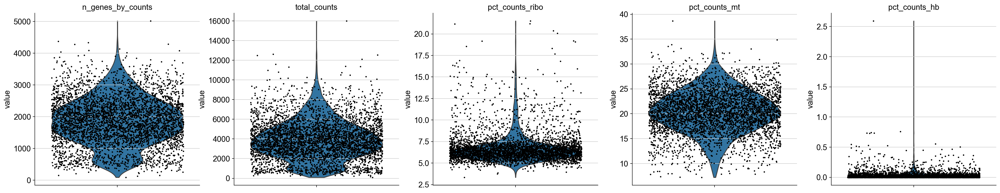

In [16]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

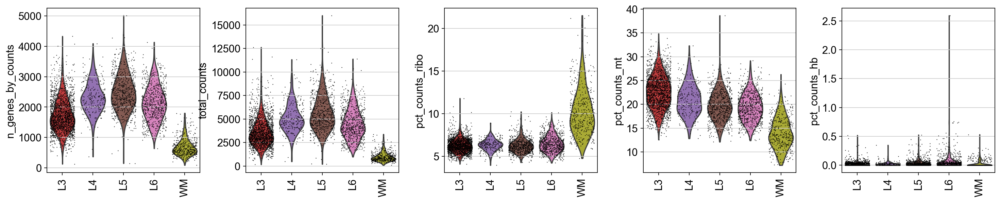

In [17]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1` и `L6` слоёв. А так же Число процент митохондриальных генов завышен в `L1` слое. Поэтому хотелось бы быть с ними аккуратнее

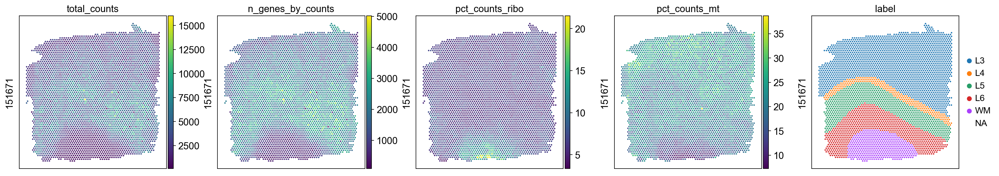

In [18]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

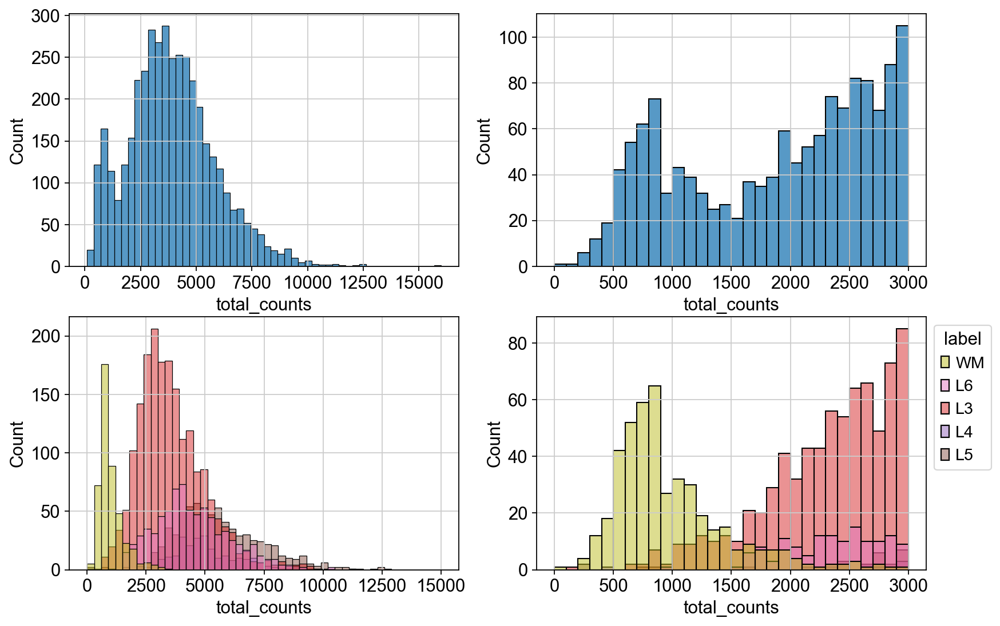

In [28]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L6', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [24]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts')

median = 3743.0, [-849.5118408203125, 8335.511840820312]


Выберем порог по `total_counts = 500`

In [31]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 500) & (adata.obs['total_counts'] < 12000))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=44

label
WM    35
L5     6
L3     2
L4     1
Name: label, dtype: int64


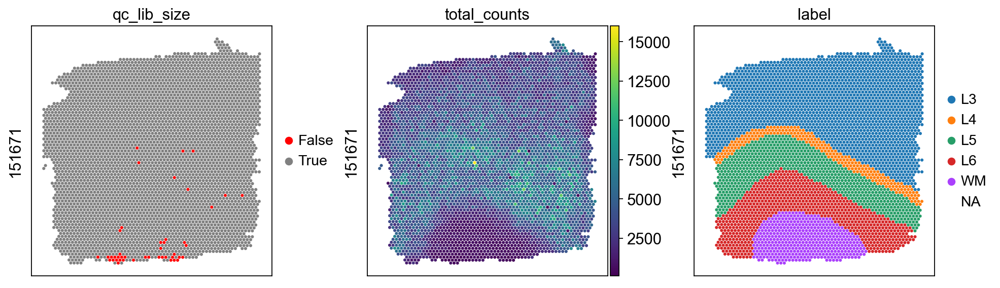

In [32]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

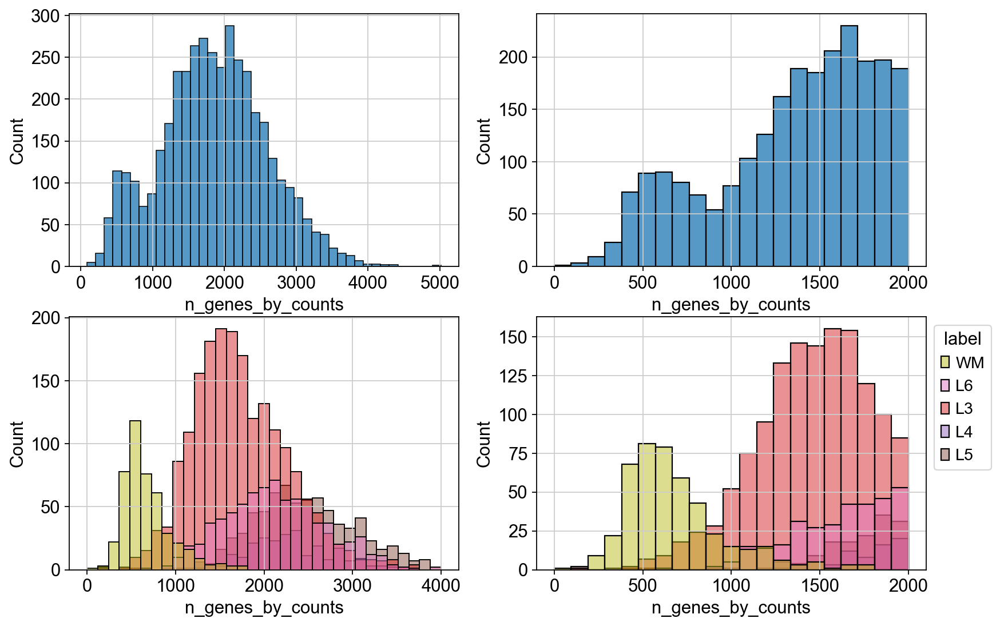

In [33]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L6', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `n_genes_by_counts = 400`

In [34]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 400))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=47

label
WM    41
L3     3
L5     2
L4     1
Name: label, dtype: int64


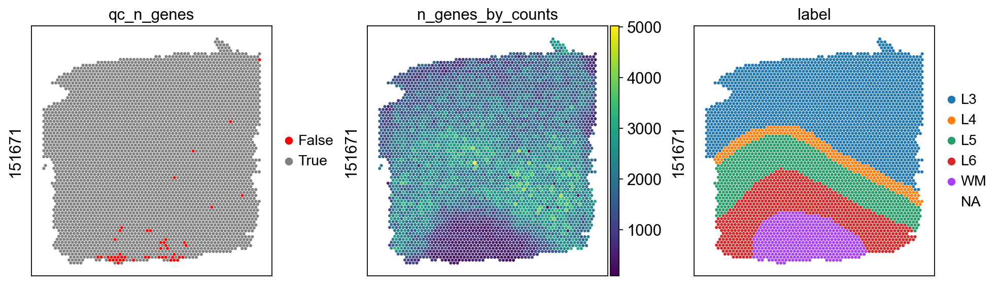

In [35]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

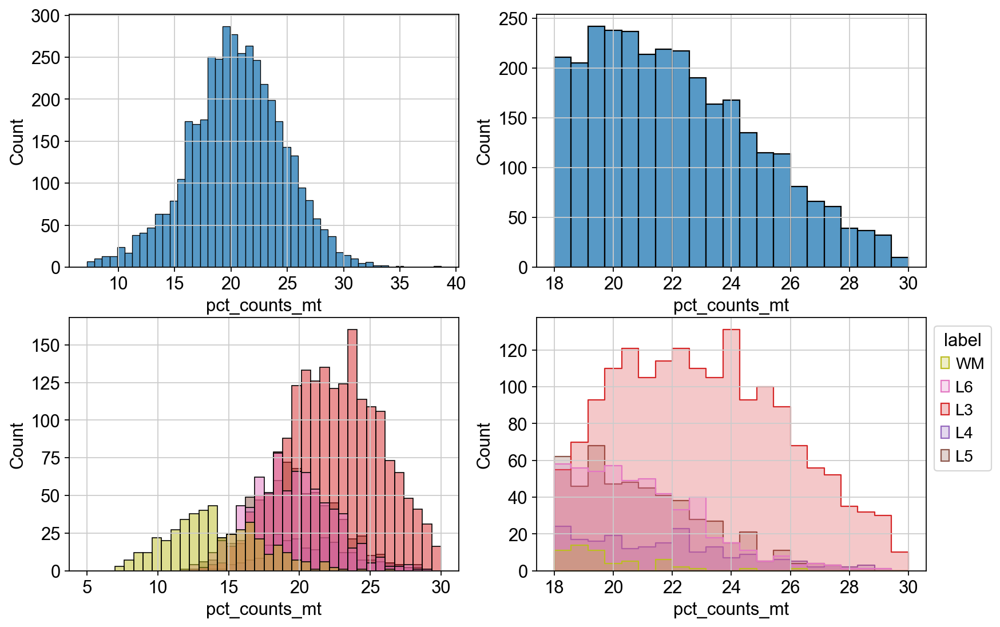

In [36]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L6', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[5, 30], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[18, 30], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[18, 30], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

В целом всё неплохо. Чтобы отфильтровать по митохондриям посчитаем 3MAD

Выберем порог по `pct_counts_mt = 23.5`

In [37]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_mt')

median = 20.475540161132812, [10.556583881378174, 30.39449644088745]


In [39]:
adata.obs['qc_mt'] = ((adata.obs['pct_counts_mt'] <= 25.5)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=465

label
L3    401
L4     22
L5     22
L6     19
WM      1
Name: label, dtype: int64


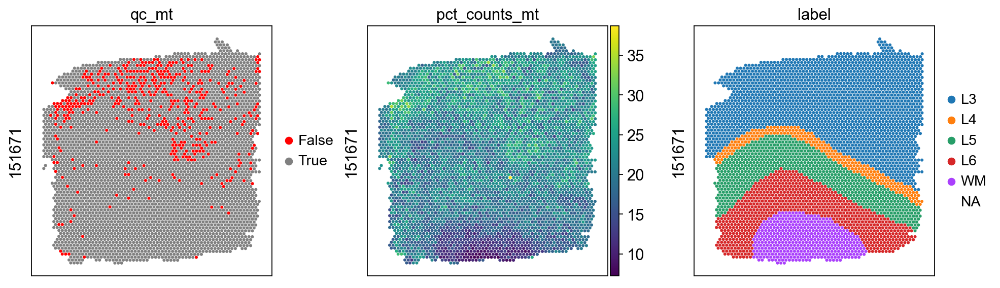

In [40]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_mt', 'pct_counts_mt', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

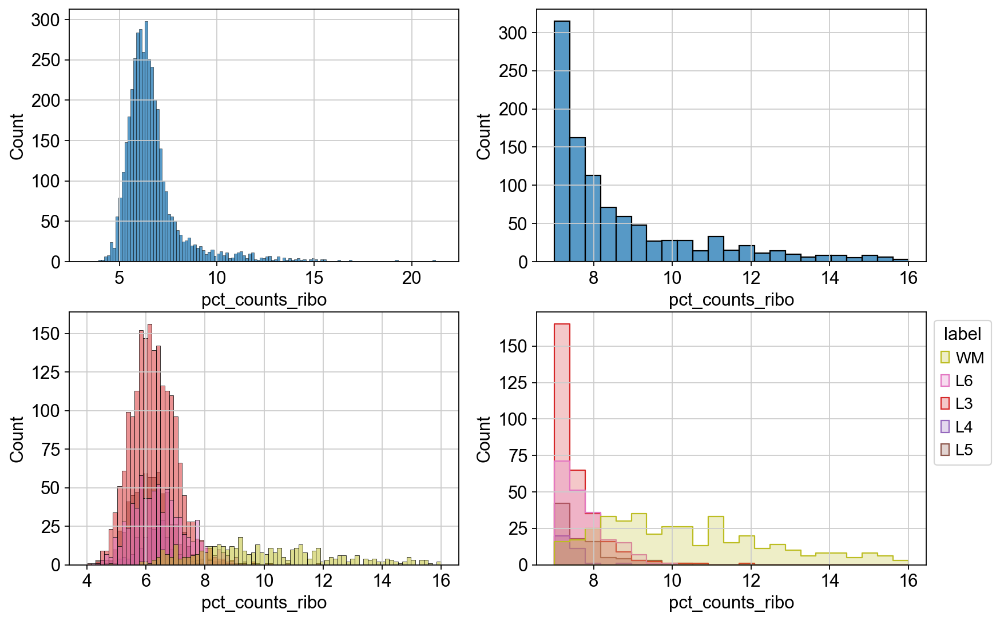

In [42]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L6', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[4, 16], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD

In [43]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_ribo')

median = 6.350476264953613, [3.1310282945632935, 9.569924235343933]


Выберем порог `pct_counts_ribo = 12`

In [47]:
adata.obs['qc_ribo'] = ((adata.obs['pct_counts_ribo'] <= 12)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=99

label
WM    99
Name: label, dtype: int64


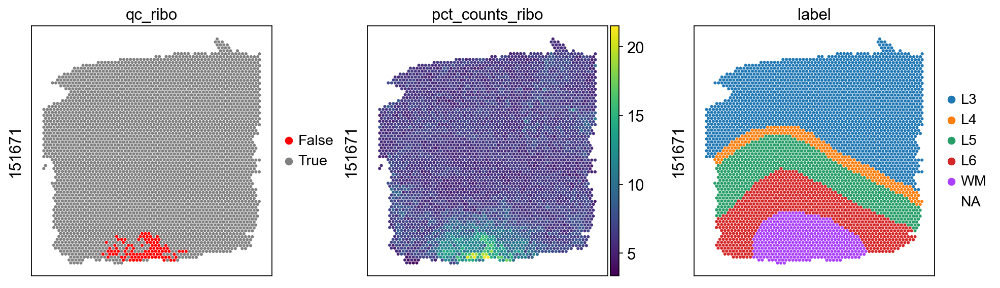

In [48]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

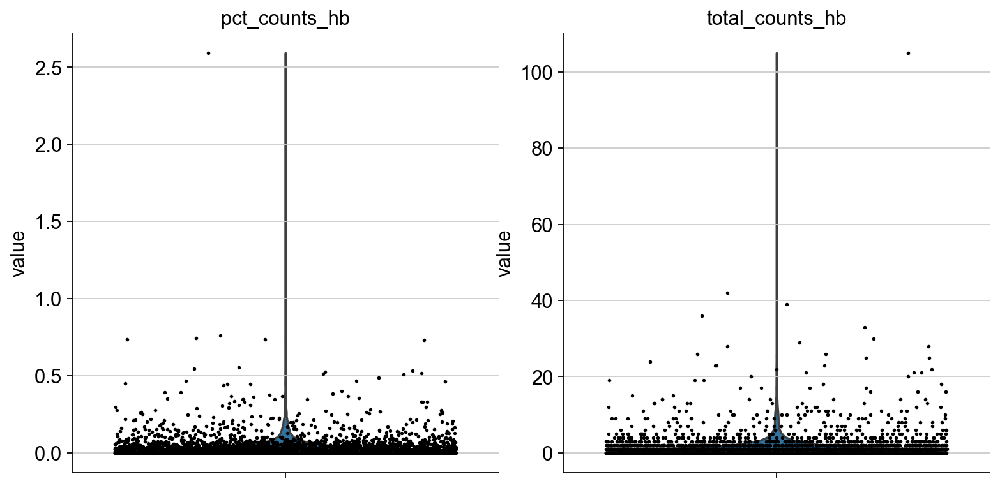

In [49]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Посчитаем 3MAD

In [50]:
median_pct, left_3mad_pct, right_3mad_pct = compute_3mad_intervals(adata.obs, 'pct_counts_hb')
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts_hb')

median = 0.0, [-0.10214987397193909, 0.10214987397193909]
median = 0.0, [-4.31821596622467, 4.31821596622467]


In [53]:
adata.obs['qc_hb'] = ((adata.obs['pct_counts_hb'] <= 2) &
                      (adata.obs['total_counts_hb'] <= 30)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_hb')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_hb'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=5

label
L6    4
L5    1
Name: label, dtype: int64


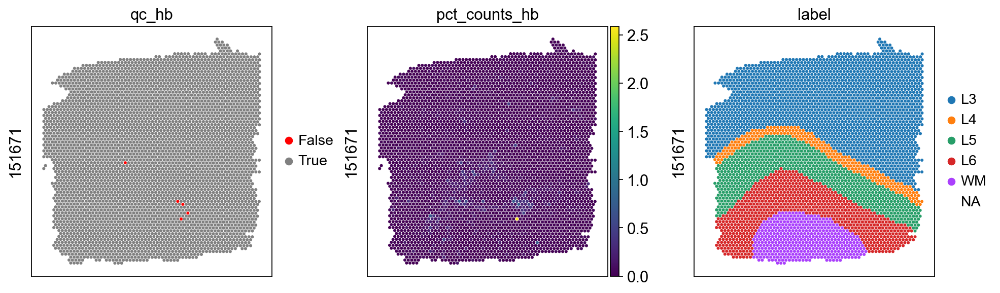

In [52]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [54]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)
adata.obs['qc_ribo'] = adata.obs['qc_ribo'].astype(object).replace(d)
adata.obs['qc_hb'] = adata.obs['qc_hb'].astype(object).replace(d)

In [55]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes *
                              adata.obs.qc_mt * adata.obs.qc_ribo * adata.obs.qc_hb).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=600

label
L3    402
WM    125
L5     27
L4     23
L6     23
Name: label, dtype: int64


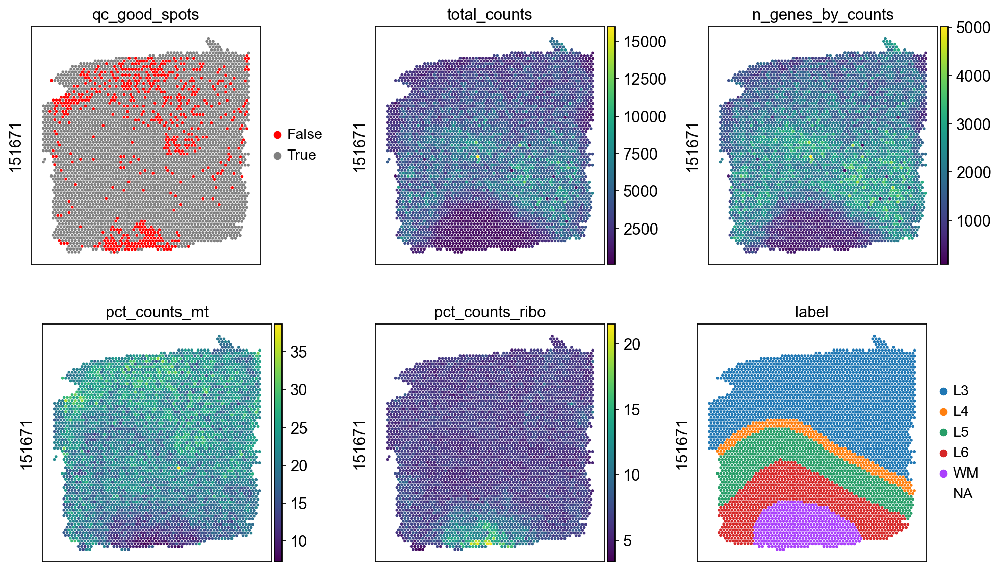

In [56]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

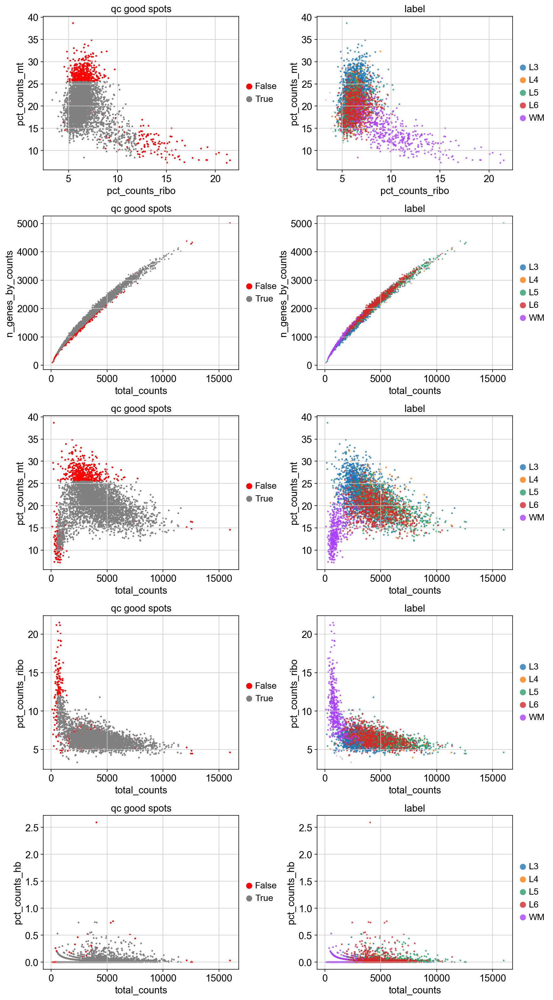

In [57]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты (без пустых)

In [58]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [59]:
adata_filtered = adata[good_spots].copy()

### PCA

In [60]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:21)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


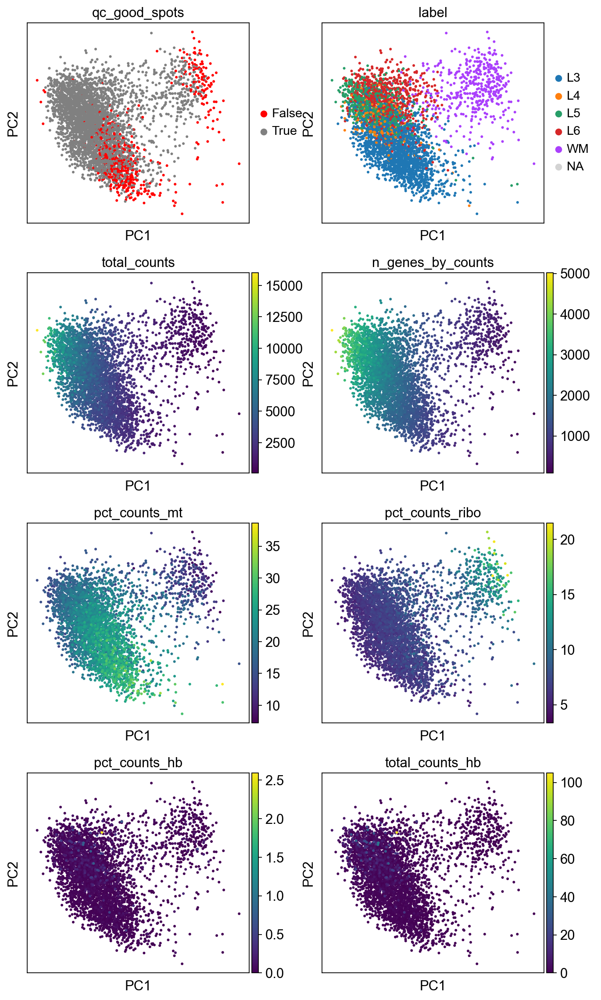

In [61]:
sc.pl.pca(adata, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=2, show=True)

## Сохраним в .h5ad

In [62]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt', 'qc_hb', 'qc_ribo'], axis=1, inplace=True)

In [63]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAAGTATCTCCCA-1,1,50,102,L5,151671,3646,9080.0,1498.0,16.497797,2.0,0.022026,509.0,5.605727
AAACACCAATAACTGC-1,1,59,19,L6,151671,2734,6183.0,1212.0,19.602135,1.0,0.016173,416.0,6.728126
AAACAGAGCGACTCCT-1,1,14,94,L3,151671,2857,6273.0,888.0,14.155907,0.0,0.000000,371.0,5.914236
AAACAGCTTTCAGAAG-1,1,43,9,L5,151671,2921,7015.0,1389.0,19.800428,0.0,0.000000,487.0,6.942266
AAACAGGGTCTATATT-1,1,47,13,L5,151671,3035,6991.0,1098.0,15.705908,1.0,0.014304,366.0,5.235302


In [64]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/libd', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/libd/{file}.h5ad')